In [2]:
import os

SAVE_IMAGE_DIR = "/content/drive/MyDrive/processed_updtrain2017"
SAVE_MASK_DIR = "/content/drive/MyDrive/processed_mask_train2017"

os.makedirs(SAVE_IMAGE_DIR, exist_ok=True)
os.makedirs(SAVE_MASK_DIR, exist_ok=True)



In [3]:
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!wget http://images.cocodataset.org/zips/train2017.zip
!wget http://images.cocodataset.org/zips/val2017.zip

--2025-11-05 10:12:25--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 54.231.200.249, 54.231.163.73, 3.5.28.171, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|54.231.200.249|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  96.6MB/s    in 2.5s    

2025-11-05 10:12:28 (96.6 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

--2025-11-05 10:12:28--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.10.137, 16.182.97.249, 16.15.204.157, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.10.137|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

tr

In [4]:
!unzip -qq train2017.zip -d train2017
!unzip -qq val2017.zip -d val2017
!unzip -qq annotations_trainval2017.zip -d annotations


In [5]:
!pip install pycocotools


In [6]:
import os
from pycocotools.coco import COCO
import numpy as np
from PIL import Image

ANNOT_PATH = 'annotations/annotations/instances_train2017.json'
IMAGE_DIR = 'train2017'
MASK_OUT_DIR = 'annotations/generated_masks'
os.makedirs(MASK_OUT_DIR, exist_ok=True)

coco = COCO(ANNOT_PATH)
img_ids = coco.getImgIds()

for img_id in img_ids:
    img_info = coco.loadImgs(img_id)[0]
    file_name = img_info['file_name']
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
    for ann in anns:
        mask |= coco.annToMask(ann)  # Combine all objects as foreground (value: 1)
    mask_img = Image.fromarray(mask)

    mask_img.save(os.path.join(MASK_OUT_DIR, file_name.replace('.jpg', '.png')))


loading annotations into memory...
Done (t=25.91s)
creating index...
index created!


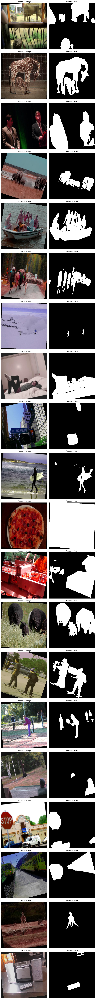

In [8]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import random

SAVE_IMAGE_DIR = "/content/drive/MyDrive/processed_updtrain2017"
SAVE_MASK_DIR = "/content/drive/MyDrive/processed_mask_train2017"

# Find 20 matching pairs
processed_images = [f for f in os.listdir(SAVE_IMAGE_DIR) if f.endswith('.jpg')]
processed_images = [f for f in processed_images if os.path.exists(os.path.join(SAVE_MASK_DIR, f.replace('.jpg', '.png')))]
selected_pairs = random.sample(processed_images, 20)

# Set figsize: For 450px = 4.5", so two columns and 20 rows
fig, axs = plt.subplots(nrows=20, ncols=2, figsize=(9, 90))  # Each subplot: 4.5x4.5 inches

for idx, img_name in enumerate(selected_pairs):
    img_path = os.path.join(SAVE_IMAGE_DIR, img_name)
    mask_path = os.path.join(SAVE_MASK_DIR, img_name.replace('.jpg', '.png'))
    img = Image.open(img_path)
    mask = Image.open(mask_path)

    axs[idx, 0].imshow(img)
    axs[idx, 0].set_title("Processed Image", fontsize=10)
    axs[idx, 0].axis('off')

    axs[idx, 1].imshow(mask, cmap='gray')
    axs[idx, 1].set_title("Processed Mask", fontsize=10)
    axs[idx, 1].axis('off')

plt.tight_layout()
plt.show()


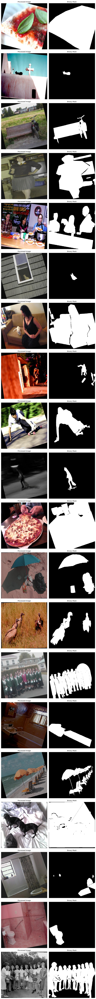

In [11]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import random

PROCESSED_IMG_DIR = "/content/drive/MyDrive/processed_updtrain2017"
PROCESSED_MASK_DIR = "/content/drive/MyDrive/processed_mask_train2017"

# Find matching image-mask pairs and pick 20 at random
all_imgs = [f for f in os.listdir(PROCESSED_IMG_DIR) if f.endswith('.jpg')]
img_mask_pairs = [f for f in all_imgs if os.path.exists(os.path.join(PROCESSED_MASK_DIR, f.replace('.jpg', '.png')))]
selected_pairs = random.sample(img_mask_pairs, 20)

dpi = 100
img_size = 450
fig, axs = plt.subplots(nrows=20, ncols=2, figsize=(img_size*2/dpi, img_size*20/dpi), dpi=dpi)

for idx, img_name in enumerate(selected_pairs):
    img_path = os.path.join(PROCESSED_IMG_DIR, img_name)
    mask_path = os.path.join(PROCESSED_MASK_DIR, img_name.replace('.jpg', '.png'))

    # Open and convert mask to binary (0/255)
    img = Image.open(img_path)
    mask = Image.open(mask_path)
    mask_np = np.array(mask)
    binary_np = np.where(mask_np == 1, 255, 0).astype(np.uint8)

    axs[idx, 0].imshow(img)
    axs[idx, 0].set_title("Processed Image", fontsize=10)
    axs[idx, 0].axis('off')

    axs[idx, 1].imshow(binary_np, cmap='gray', vmin=0, vmax=255)
    axs[idx, 1].set_title("Binary Mask", fontsize=10)
    axs[idx, 1].axis('off')

plt.tight_layout()
plt.show()
